In [1]:
%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 300

In [2]:
date = '071223'
mouse = '58'

In [19]:
cd "C:\Users\andre\Desktop\active_neuron"


C:\Users\andre\Desktop\active_neuron


In [20]:
%pwd

'C:\\Users\\andre\\Desktop\\active_neuron'

In [21]:
# keys of the np array dictionary
data_all = np.load('data/BCI_' + mouse + '-' + date + '.npy', allow_pickle = True).item()
data_all.keys()

dict_keys(['dt_si', 'iscell', 'dat_file', 'session', 'mouse', 'mean_image', 'fov', 'dprime_1dFperF', 'version', 'spont', 'BCI_1', 'BCI_2', 'photostim'])

In [22]:
data = []
dataset_id = 0
data.append(data_all['photostim'])

In [23]:
# keys of each photostim
data[dataset_id].keys()

dict_keys(['FstimRaw', 'Fstim', 'seq', 'favg', 'stimDist', 'stimPosition', 'centroidX', 'centroidY', 'slmDist', 'stimID', 'siHeader'])

In [24]:
data[dataset_id]['Fstim'].shape

(25, 507, 2056)

In [25]:
data[dataset_id]['FstimRaw'].shape

(507, 29402)

In [26]:
seq = data[dataset_id]['seq']

In [27]:
seq

array([92,  7, 59, ..., 86, 76, 21], dtype=int64)

In [28]:
data[dataset_id].keys()

dict_keys(['FstimRaw', 'Fstim', 'seq', 'favg', 'stimDist', 'stimPosition', 'centroidX', 'centroidY', 'slmDist', 'stimID', 'siHeader'])

In [29]:
stimDist = data[dataset_id]['stimDist']

In [30]:
data[dataset_id]['stimPosition'].shape

(10, 2, 100)

In [31]:
data_all['photostim']['slmDist'].shape

(507, 100)

In [32]:
data_all['photostim']['stimDist'].shape

(507, 100)

Text(0, 0.5, 'y coordinate')

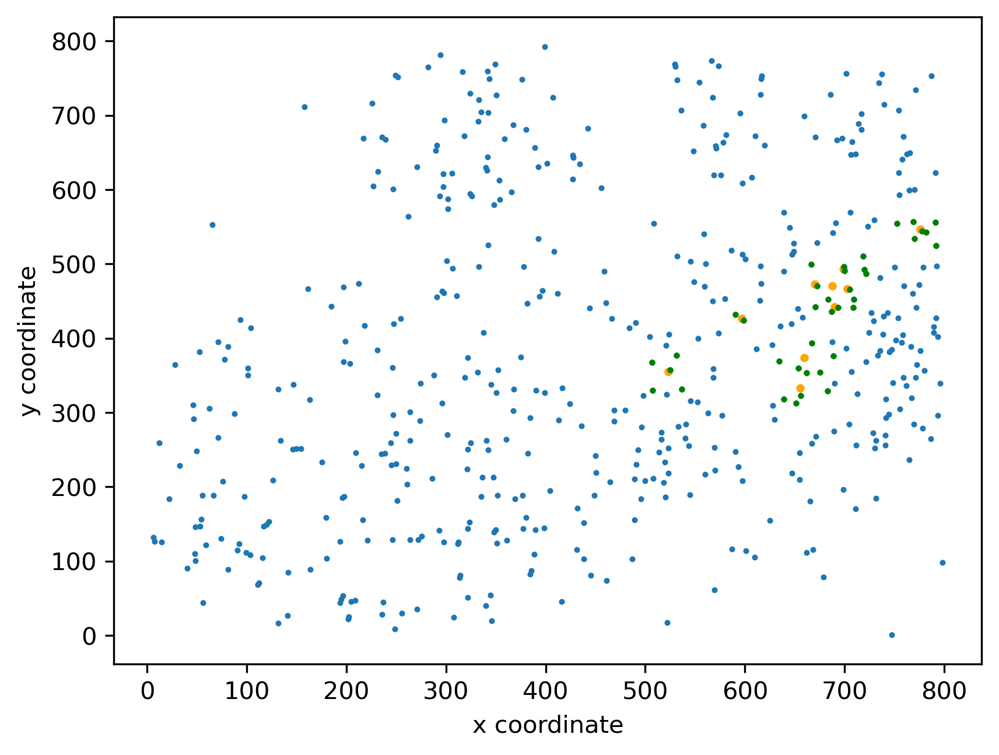

In [33]:
stim_group_id = 0
#neurons with distance to stimulation laser of less than 50
close_perturbation_center_neuron_ids = data_all['photostim']['slmDist'][:,stim_group_id] < 50
#indices of neurons with a distance to stimulation target of less than 30
target_neuron_ids = np.where(data_all['photostim']['stimDist'][:,stim_group_id] < 30)[0]

#all neurons
plt.scatter(data_all['photostim']['centroidX'], data_all['photostim']['centroidY'], s = 2)

#orange is the stimulation points
plt.scatter(data[dataset_id]['stimPosition'][:,0,stim_group_id], data[dataset_id]['stimPosition'][:,1,stim_group_id], s = 6, alpha = 1.0, color = 'orange')

#target neurons with distance of <30 from earlier
plt.scatter(np.asarray(data_all['photostim']['centroidX'])[target_neuron_ids], np.asarray(data_all['photostim']['centroidY'])[target_neuron_ids], color = 'green', s = 2)
plt.scatter(np.asarray(data_all['photostim']['centroidX'])[target_neuron_ids], np.asarray(data_all['photostim']['centroidY'])[target_neuron_ids], color = 'green', s = 2)
plt.xlabel('x coordinate')
plt.ylabel('y coordinate')

In [35]:
#first 100 stimulation points data
data[dataset_id]['stimID'][:100]

array([ 0., 92.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  7.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0., 59.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  6.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0., 16.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 57.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 86.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [36]:
stimID = (data[dataset_id]['stimID'])
np.where(stimID != 0)

(array([    1,    16,    30, ..., 29324, 29338, 29352], dtype=int64),)

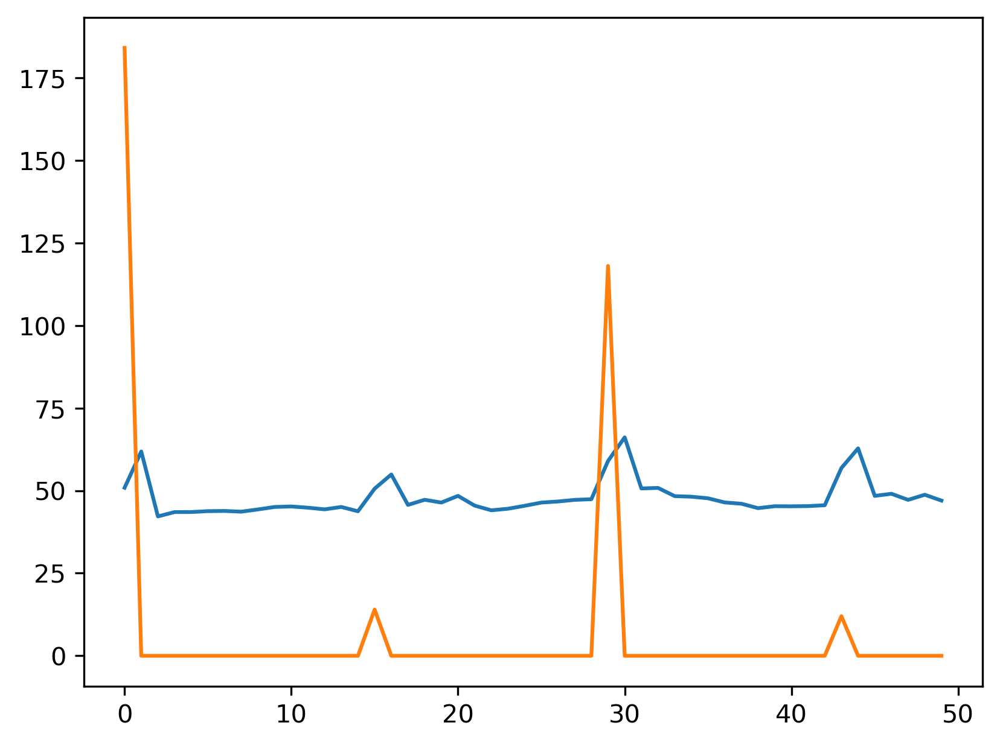

In [37]:
### padding zero right end to correct the shift
#stimID - ID that denote specific stimulation events
#FstimRaw - raw data that represents response of neurons during experiment
stimID_correct = (data[dataset_id]['stimID']).copy()
stimID_correct[:-1] = data[dataset_id]['stimID'][1:]

#compare plots of mean of first 50 elements of 'FstimRaw' this is blue
plt.plot(np.mean(data[dataset_id]['FstimRaw'],axis=0)[:50])

#orange plot of stimulation data
plt.plot(stimID_correct[:50]*2)                                               

In [38]:
num_trials = np.where(stimID_correct != 0)[0].shape[0]
num_neurons = data[dataset_id]['FstimRaw'].shape[0]
interp_len = 3
Fstim_interp = data[dataset_id]['FstimRaw'].copy()
Fstim_baseline_mean = np.mean(Fstim_interp, axis = 1)
Fstim_baseline_std = np.std(Fstim_interp, axis = 1)
Fstim_interp_norm = Fstim_interp
stim_steps = np.where(stimID_correct != 0)[0]

In [39]:
stim_dist = 10
num_unique_groups = 100
stim_input = np.zeros(Fstim_interp.shape[1])
stim_input_id = np.zeros((Fstim_interp.shape[1], num_neurons))
stim_input_group_id = np.zeros((Fstim_interp.shape[1], num_unique_groups))
stim_continuous_input_id = np.zeros((Fstim_interp.shape[1], num_neurons))
data_all['photostim']['slmDist']
for i in range(stim_steps.shape[0]):
    stim_input[stim_steps[i]: stim_steps[i] + interp_len] = 1
    stim_group_id = int(stimID_correct[stim_steps[i]] - 1)
    stim_neuron_ids = np.where(stimDist[:,stim_group_id]<stim_dist)[0]
    target_mask = np.zeros((num_neurons))
    target_mask[stim_neuron_ids]  = 1
    stim_input_id[stim_steps[i]: stim_steps[i] + interp_len, :] = target_mask
    spatial_input = np.exp(-data_all['photostim']['stimDist'][:,stim_group_id]/10) * np.exp(-data_all['photostim']['slmDist'][:,stim_group_id]/200)
    stim_continuous_input_id[stim_steps[i]: stim_steps[i] + interp_len, :] = spatial_input
    stim_input_group_id[stim_steps[i]: stim_steps[i] + interp_len, stim_group_id] = 1 

In [40]:
data_save = {
        'u_session': stim_input_id,
        'u_spatial_session': stim_continuous_input_id,
        'y_session': Fstim_interp_norm.T,
        'x1': np.asarray(data_all['photostim']['centroidX']),
        'x2': np.asarray(data_all['photostim']['centroidY']),
        'o1': data[dataset_id]['stimPosition'][:,0,:],
        'o2': data[dataset_id]['stimPosition'][:,1,:]}
np.save('sample_photostim_'+ mouse + '_spatial_date_' + date + '.npy', data_save)

In [49]:
pre_trans_path = r"C:\Users\andre\Desktop\active_neuron\data\BCI_58-071223.npy"
#trans_path = r"C:\Users\andre\Desktop\active_neuron\sample_photostim_58_spatial_date_071223.npy"

pre_trans_data = np.load(pre_trans_path, allow_pickle=True)
#trans_data = np.load(trans_path, allow_pickle=True)

print(pre_trans_data)
#print(trans_data)

{'dt_si': 0.05149463168464688, 'iscell': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 

In [41]:
# session data
y_session = data_save['y_session']
u_session = data_save['u_session']
print('y_session', y_session.shape)
print('u_session', u_session.shape)

y_session (29402, 507)
u_session (29402, 507)


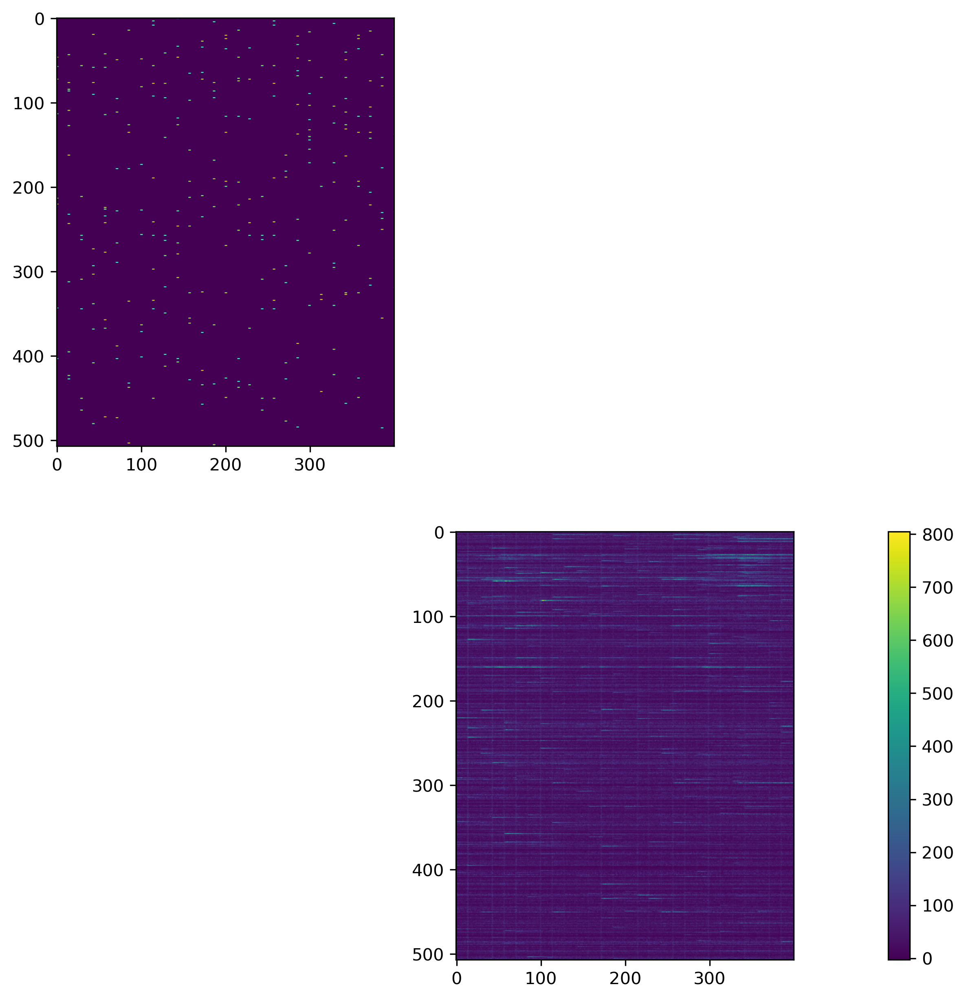

In [42]:
# nan represent removed interpolated steps in y
fig, axes = plt.subplots(2, 1, figsize=(20,10))
time_wind_start = 840
time_wind_end = 1240
neuron_start = 0
neuron_end = 1000

axes[0].imshow(u_session[time_wind_start: time_wind_end, neuron_start:neuron_end].T)
# axes[0].set_title('stimulation inputs')
# axes[0].set_xlabel('time steps')
# axes[0].set_ylabel('neuron id')
im = axes[1].imshow(y_session[time_wind_start: time_wind_end, neuron_start:neuron_end].T)
fig.colorbar(im)
# axes[1].set_title('in vivo calcium recording')
# axes[1].set_xlabel('time step')
# axes[1].set_ylabel('neuron id')
fig.savefig('photo_intro.pdf')

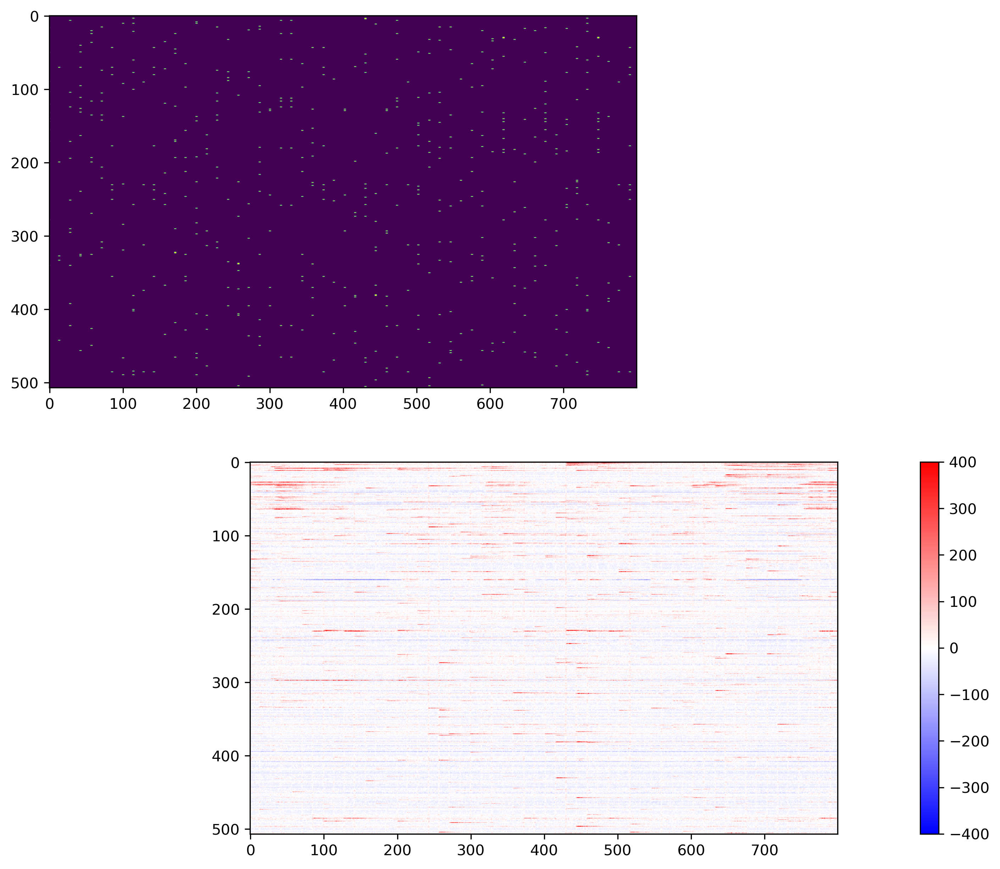

In [43]:
# nan represent removed interpolated steps in y
fig, axes = plt.subplots(2, 1, figsize=(20,10))
time_wind_start = 1140
time_wind_end = 1940
neuron_start = 0
neuron_end = 1000

axes[0].imshow(u_session[time_wind_start: time_wind_end, neuron_start:neuron_end].T)
# axes[0].set_title('stimulation inputs')
# axes[0].set_xlabel('time steps')
# axes[0].set_ylabel('neuron id')
im = axes[1].imshow(y_session[time_wind_start: time_wind_end, neuron_start:neuron_end].T - y_session[0, neuron_start:neuron_end][None,:].T, cmap='bwr', vmin = -400, vmax = 400)
fig.colorbar(im)
# axes[1].set_title('in vivo calcium recording')
# axes[1].set_xlabel('time step')
# axes[1].set_ylabel('neuron id')
fig.savefig('photo_intro.pdf')

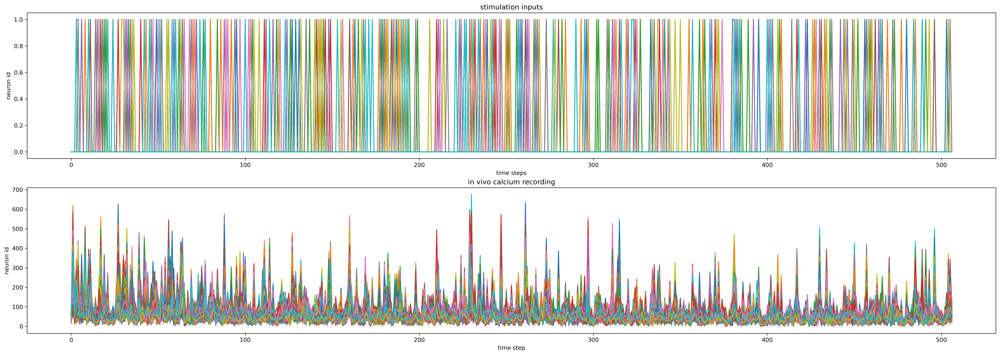

In [44]:
# nan represent removed interpolated steps in y
fig, axes = plt.subplots(2, 1, figsize=(30,10))
time_wind_start = 1000
time_wind_end = 2000
axes[0].plot(u_session[time_wind_start: time_wind_end].T)
axes[0].set_title('stimulation inputs')
axes[0].set_xlabel('time steps')
axes[0].set_ylabel('neuron id')
axes[1].plot(y_session[time_wind_start: time_wind_end].T)
axes[1].set_title('in vivo calcium recording')
axes[1].set_xlabel('time step')
axes[1].set_ylabel('neuron id')
fig.savefig('photo_intro.pdf')